En vous basant sur les précédents travaux pratiques que vous avez effectués. Construire une application web interactive utilisant la librairie streamlit et une ou deux librairies de dataviz (matplotlib, seaborn, altair, bokeh et plotly).

L'idée principale du projet est de choisir un jeu de données de data.gouv.fr et de construire une application web de dataviz pour répondre à des questions utiles sur ce jeu de données, en donnant à vos utilisateurs des informations utiles et la possibilité d'interagir avec les données.

Le jeu de données que vous choisissez peut avoir un lien avec le thème de l'ESR, ce n'est pas obligatoire mais fortement recommandé. Voici le lien pour en savoir plus sur l'ESR : https://www.economie.gouv.fr/entreprises/responsabilite-societale-entreprises-rse

## Directives techniques :
L'application streamlit doit respecter les **exigences techniques** suivantes (vous les organisez comme vous le souhaitez, car le plus important est d'apporter des informations à vos utilisateurs) :
- Tout le code doit être organisé en fonctions, si vous pouvez écrire des commentaires, c'est toujours mieux. Pensez à du code modulable, à des blocs de traitement de données, à des étapes de travail. Cela vous aidera à organiser votre code en fonctions modulaires.
- 4 graphiques internes à streamlit : st.line, st.bar_chart, st.scatter_chart, st.map **st.line_chart st.scatter_chart fait**
- 4 graphiques externes différents (histogrammes, diagrammes à barres, diagrammes de dispersion ou diagrammes circulaires) intégrés à votre application à partir de bibliothèques externes telles que matplotlib, seaborn, plotly ou Altair.
- 4 éléments interactifs (case à cocher, curseur ....)
- Utilisation du cache : cache pour le chargement et le pré-traitement des données
- - Optionnel : un décorateur qui enregistre dans un fichier l'intervalle de temps d'exécution en secondes (30 secondes, 2 secondes, 0.01 seconde, ...) et l'horodatage de l'appel ()
- - Facultatif : essayez d'organiser vos appels de fonctions dans une fonction principale afin d'avoir un flux de travail clair de votre application.

**Gardez à l'esprit que l'idée est de fournir des informations utiles et de dessiner une histoire à propos de vos données. Vous devez donc prendre le temps d'explorer, de concevoir et d'organiser votre tableau de bord en choisissant les questions auxquelles vous voulez répondre et les informations que vous voulez présenter.**


In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as pyo
import plotly.figure_factory as ff

print("--- IMPORT DONE ---")

--- IMPORT DONE ---


In [60]:
dataframe = pd.read_csv(
    "C:\Data\Projet CODE\Code Python\Data Visualisation\DataViz S7\Project\data\gouv_data\consommation-quotidienne-brute_clean.csv",
    delimiter=',')
dataframe.head()

,date_heure,date,heure,consommation_brute_gaz_grtgaz,statut_grtgaz,consommation_brute_gaz_terega,statut_terega,consommation_brute_gaz_totale,consommation_brute_electricite_rte,statut_rte,consommation_brute_totale
0,2012-01-01 00:00:00+01:00,2012-01-01,00:00:00,52099.0,Définitif,3254.0,Définitif,55353.0,59610,Définitif,114963.0
1,2012-01-01 01:00:00+01:00,2012-01-01,01:00:00,52236.0,Définitif,3208.0,Définitif,55444.0,56230,Définitif,111674.0
2,2012-01-01 02:00:00+01:00,2012-01-01,02:00:00,52251.0,Définitif,3214.0,Définitif,55465.0,55531,Définitif,110996.0
3,2012-01-01 03:00:00+01:00,2012-01-01,03:00:00,52836.0,Définitif,3212.0,Définitif,56048.0,52496,Définitif,108544.0
4,2012-01-01 04:00:00+01:00,2012-01-01,04:00:00,53745.0,Définitif,3337.0,Définitif,57082.0,49160,Définitif,106242.0


In [3]:
# Shape of the dataframe
dataframe.shape

(204528, 11)

In [3]:
# Check if there is any missing value
dataframe.isnull().sum()

date_heure                                 0
date                                       0
heure                                      0
consommation_brute_gaz_grtgaz         103008
statut_grtgaz                         102264
consommation_brute_gaz_terega         102267
statut_terega                         102264
consommation_brute_gaz_totale         103012
consommation_brute_electricite_rte         0
statut_rte                                 0
consommation_brute_totale             103012
dtype: int64

In [50]:
# Remove lines with missing values
dataframe = dataframe.dropna()

In [78]:
dataframe.columns

Index(['date_heure', 'date', 'heure', 'consommation_brute_gaz_grtgaz',
       'statut_grtgaz', 'consommation_brute_gaz_terega', 'statut_terega',
       'consommation_brute_gaz_totale', 'consommation_brute_electricite_rte',
       'statut_rte', 'consommation_brute_totale'],
      dtype='object')

In [49]:
# Remove every pair row
dataframe = dataframe.drop(dataframe.index[::2])

# Reset index
dataframe = dataframe.reset_index(drop=True)
dataframe.head()

,date_heure,date,heure,consommation_brute_gaz_grtgaz,statut_grtgaz,consommation_brute_gaz_terega,statut_terega,consommation_brute_gaz_totale,consommation_brute_electricite_rte,statut_rte,consommation_brute_totale
0,2023-08-31T23:00:00+02:00,31/08/2023,23:00,23599.0,Définitif,1114.0,Définitif,24713.0,43562,Consolidé,68275.0
1,2023-08-31T22:00:00+02:00,31/08/2023,22:00,24935.0,Définitif,1181.0,Définitif,26116.0,43430,Consolidé,69546.0
2,2023-08-31T21:00:00+02:00,31/08/2023,21:00,26360.0,Définitif,1321.0,Définitif,27681.0,44511,Consolidé,72192.0
3,2023-08-31T20:00:00+02:00,31/08/2023,20:00,27466.0,Définitif,1443.0,Définitif,28909.0,45412,Consolidé,74321.0
4,2023-08-31T19:00:00+02:00,31/08/2023,19:00,27928.0,Définitif,1409.0,Définitif,29337.0,47232,Consolidé,76569.0


In [61]:
# Check if there is any missing value
dataframe.isnull().sum()

date_heure                            0
date                                  0
heure                                 0
consommation_brute_gaz_grtgaz         0
statut_grtgaz                         0
consommation_brute_gaz_terega         0
statut_terega                         0
consommation_brute_gaz_totale         0
consommation_brute_electricite_rte    0
statut_rte                            0
consommation_brute_totale             0
dtype: int64

In [70]:
# convert to datetime
dataframe['date_heure'] = pd.to_datetime(dataframe['date_heure'], utc=True)
dataframe['date'] = pd.to_datetime(dataframe['date'])
dataframe.dtypes

date_heure                            datetime64[ns, UTC]
date                                       datetime64[ns]
heure                                              object
consommation_brute_gaz_grtgaz                     float64
statut_grtgaz                                      object
consommation_brute_gaz_terega                     float64
statut_terega                                      object
consommation_brute_gaz_totale                     float64
consommation_brute_electricite_rte                  int64
statut_rte                                         object
consommation_brute_totale                         float64
dtype: object

In [52]:
# Convert 'date' to datetime and 'heure' to time
# dataframe['date_heure'] = pd.to_datetime(dataframe['date_heure'], utc=True)
# dataframe['date'] = pd.to_datetime(dataframe['date'], dayfirst=True)
# dataframe['heure'] = pd.to_datetime(dataframe['heure'], format='%H:%M')

dataframe.dtypes

date_heure                            datetime64[ns, UTC]
date                                       datetime64[ns]
heure                                      datetime64[ns]
consommation_brute_gaz_grtgaz                     float64
statut_grtgaz                                      object
consommation_brute_gaz_terega                     float64
statut_terega                                      object
consommation_brute_gaz_totale                     float64
consommation_brute_electricite_rte                  int64
statut_rte                                         object
consommation_brute_totale                         float64
dtype: object

In [37]:
dataframe['heure'] = pd.to_datetime(dataframe['heure']).dt.time

In [40]:
dataframe.dtypes

date_heure                            datetime64[ns, UTC]
date                                       datetime64[ns]
heure                                              object
consommation_brute_gaz_grtgaz                     float64
statut_grtgaz                                      object
consommation_brute_gaz_terega                     float64
statut_terega                                      object
consommation_brute_gaz_totale                     float64
consommation_brute_electricite_rte                  int64
statut_rte                                         object
consommation_brute_totale                         float64
dtype: object

In [11]:
# Show only the lines with missing values
dataframe[dataframe.isnull().any(axis=1)]

,date_heure,date,heure,consommation_brute_gaz_grtgaz,statut_grtgaz,consommation_brute_gaz_terega,statut_terega,consommation_brute_gaz_totale,consommation_brute_electricite_rte,statut_rte,consommation_brute_totale
3812,2023-03-26 03:30:00+02:00,2023-03-26,03:30:00,NaN,NaN,NaN,NaN,NaN,37351,Consolidé,NaN
5832,2022-12-31 23:00:00+01:00,2022-12-31,23:00:00,NaN,Définitif,2153.0,Définitif,NaN,47566,Définitif,NaN
5833,2022-12-31 22:00:00+01:00,2022-12-31,22:00:00,NaN,Définitif,2381.0,Définitif,NaN,45841,Définitif,NaN
5834,2022-12-31 21:00:00+01:00,2022-12-31,21:00:00,NaN,Définitif,2559.0,Définitif,NaN,45898,Définitif,NaN
5835,2022-12-31 20:00:00+01:00,2022-12-31,20:00:00,NaN,Définitif,2657.0,Définitif,NaN,47840,Définitif,NaN
...,...,...,...,...,...,...,...,...,...,...,...
65132,2016-03-27 03:30:00+02:00,2016-03-27,02:30:00,NaN,NaN,NaN,NaN,NaN,52243,Définitif,NaN
73868,2015-03-29 03:30:00+02:00,2015-03-29,02:30:00,NaN,NaN,NaN,NaN,NaN,52852,Définitif,NaN
82604,2014-03-30 03:30:00+02:00,2014-03-30,03:30:00,NaN,NaN,NaN,NaN,NaN,47855,Définitif,NaN
91340,2013-03-31 03:30:00+02:00,2013-03-31,03:30:00,NaN,NaN,NaN,NaN,NaN,62694,Définitif,NaN


In [12]:
# Show how many missing values there is
dataframe.isnull().sum() / len(dataframe) * 100

date_heure                            0.000000
date                                  0.000000
heure                                 0.000000
consommation_brute_gaz_grtgaz         0.762732
statut_grtgaz                         0.082140
consommation_brute_gaz_terega         0.038137
statut_terega                         0.082140
consommation_brute_gaz_totale         0.766643
consommation_brute_electricite_rte    0.000000
statut_rte                            0.000000
consommation_brute_totale             0.766643
dtype: float64

In [8]:
dataframe.isnull().sum()

date_heure                            0
date                                  0
heure                                 0
consommation_brute_gaz_grtgaz         0
statut_grtgaz                         0
consommation_brute_gaz_terega         0
statut_terega                         0
consommation_brute_gaz_totale         0
consommation_brute_electricite_rte    0
statut_rte                            0
consommation_brute_totale             0
dtype: int64

In [13]:
dataframe.shape

(101480, 11)

In [35]:
# Sort by date and hour
dataframe = dataframe.sort_values(by=['date_heure'])

In [34]:
# Reset index
dataframe = dataframe.reset_index(drop=True)

dataframe

,date_heure,date,heure,consommation_brute_gaz_grtgaz,statut_grtgaz,consommation_brute_gaz_terega,statut_terega,consommation_brute_gaz_totale,consommation_brute_electricite_rte,statut_rte,consommation_brute_totale
0,2023-08-31 21:00:00+00:00,2023-08-31,23,23599.0,Définitif,1114.0,Définitif,24713.0,43562,Consolidé,68275.0
1,2023-08-31 20:00:00+00:00,2023-08-31,22,24935.0,Définitif,1181.0,Définitif,26116.0,43430,Consolidé,69546.0
2,2023-08-31 19:00:00+00:00,2023-08-31,21,26360.0,Définitif,1321.0,Définitif,27681.0,44511,Consolidé,72192.0
3,2023-08-31 18:00:00+00:00,2023-08-31,20,27466.0,Définitif,1443.0,Définitif,28909.0,45412,Consolidé,74321.0
4,2023-08-31 17:00:00+00:00,2023-08-31,19,27928.0,Définitif,1409.0,Définitif,29337.0,47232,Consolidé,76569.0
...,...,...,...,...,...,...,...,...,...,...,...
101475,2012-01-01 03:00:00+00:00,2012-01-01,4,53745.0,Définitif,3337.0,Définitif,57082.0,49160,Définitif,106242.0
101476,2012-01-01 02:00:00+00:00,2012-01-01,3,52836.0,Définitif,3212.0,Définitif,56048.0,52496,Définitif,108544.0
101477,2012-01-01 01:00:00+00:00,2012-01-01,2,52251.0,Définitif,3214.0,Définitif,55465.0,55531,Définitif,110996.0
101478,2012-01-01 00:00:00+00:00,2012-01-01,1,52236.0,Définitif,3208.0,Définitif,55444.0,56230,Définitif,111674.0


In [21]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101480 entries, 0 to 101479
Data columns (total 11 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   date_heure                          101480 non-null  object 
 1   date                                101480 non-null  object 
 2   heure                               101480 non-null  object 
 3   consommation_brute_gaz_grtgaz       101480 non-null  float64
 4   statut_grtgaz                       101480 non-null  object 
 5   consommation_brute_gaz_terega       101480 non-null  float64
 6   statut_terega                       101480 non-null  object 
 7   consommation_brute_gaz_totale       101480 non-null  float64
 8   consommation_brute_electricite_rte  101480 non-null  int64  
 9   statut_rte                          101480 non-null  object 
 10  consommation_brute_totale           101480 non-null  float64
dtypes: float64(4), int64(1), o

In [73]:
# Sort by date_heure
dataframe = dataframe.sort_values(by=['date_heure'])
dataframe

,date_heure,date,heure,consommation_brute_gaz_grtgaz,statut_grtgaz,consommation_brute_gaz_terega,statut_terega,consommation_brute_gaz_totale,consommation_brute_electricite_rte,statut_rte,consommation_brute_totale
102263,2011-12-31 23:00:00+00:00,2012-01-01,00:00:00,52099.0,Définitif,3254.0,Définitif,55353.0,59610,Définitif,114963.0
102262,2012-01-01 00:00:00+00:00,2012-01-01,01:00:00,52236.0,Définitif,3208.0,Définitif,55444.0,56230,Définitif,111674.0
102261,2012-01-01 01:00:00+00:00,2012-01-01,02:00:00,52251.0,Définitif,3214.0,Définitif,55465.0,55531,Définitif,110996.0
102260,2012-01-01 02:00:00+00:00,2012-01-01,03:00:00,52836.0,Définitif,3212.0,Définitif,56048.0,52496,Définitif,108544.0
102259,2012-01-01 03:00:00+00:00,2012-01-01,04:00:00,53745.0,Définitif,3337.0,Définitif,57082.0,49160,Définitif,106242.0
...,...,...,...,...,...,...,...,...,...,...,...
4,2023-08-31 17:00:00+00:00,2023-08-31,19:00:00,27928.0,Définitif,1409.0,Définitif,29337.0,47232,Consolidé,76569.0
3,2023-08-31 18:00:00+00:00,2023-08-31,20:00:00,27466.0,Définitif,1443.0,Définitif,28909.0,45412,Consolidé,74321.0
2,2023-08-31 19:00:00+00:00,2023-08-31,21:00:00,26360.0,Définitif,1321.0,Définitif,27681.0,44511,Consolidé,72192.0
1,2023-08-31 20:00:00+00:00,2023-08-31,22:00:00,24935.0,Définitif,1181.0,Définitif,26116.0,43430,Consolidé,69546.0


In [24]:
# List of numeric columns of the dataframe
numeric_columns = dataframe.select_dtypes(include=np.number).columns.tolist()

print(numeric_columns)

['consommation_brute_gaz_grtgaz', 'consommation_brute_gaz_terega', 'consommation_brute_gaz_totale', 'consommation_brute_electricite_rte', 'consommation_brute_totale']


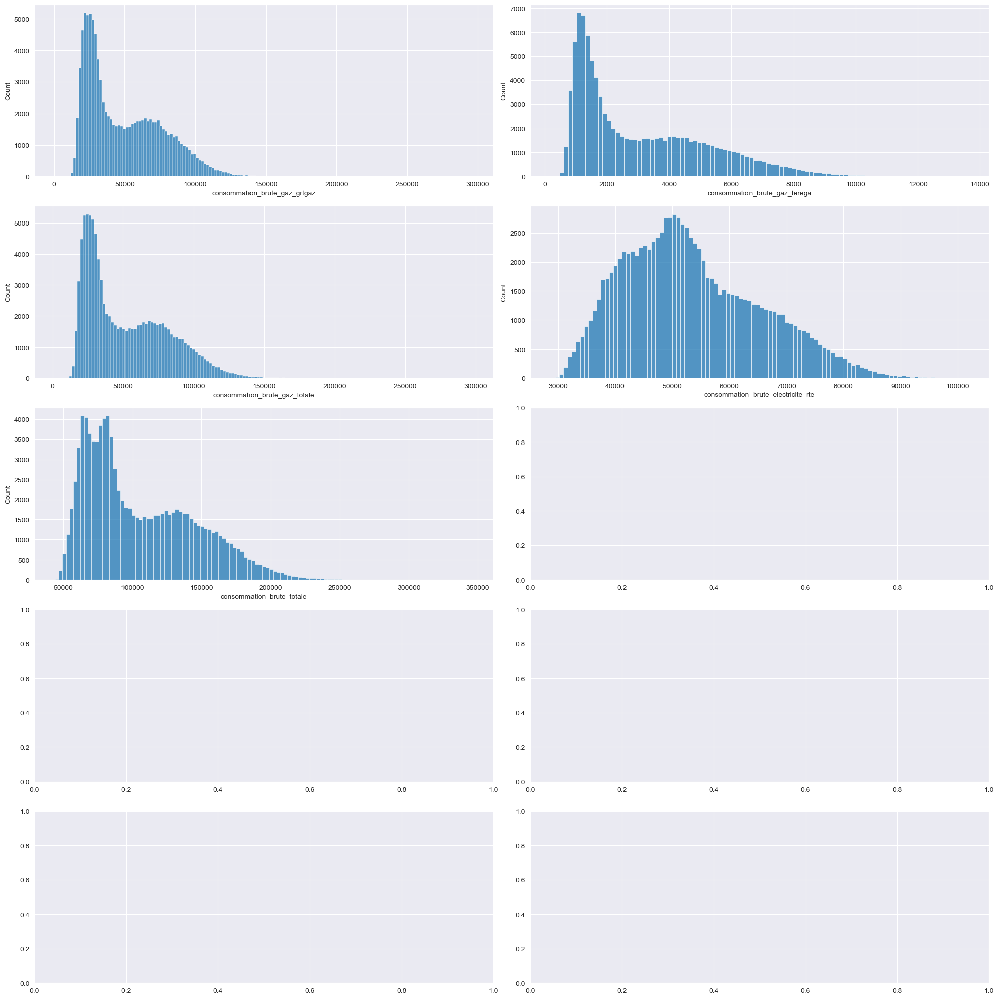

In [30]:
# Distribution of numeric columns of the dataframe with seaborn with a subplot for 5 columns
fig, axes = plt.subplots(5, 2, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    sns.histplot(dataframe[col], ax=axes[i])

plt.tight_layout()
plt.show()

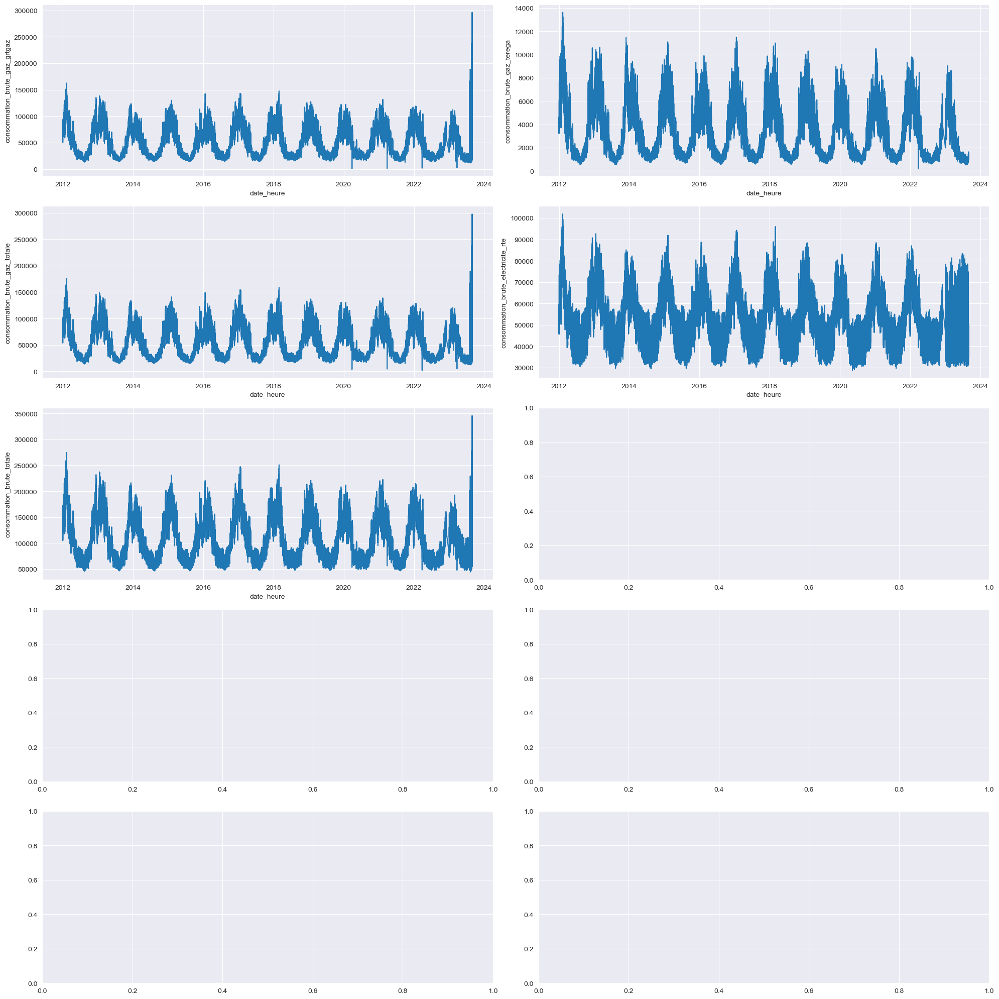

In [31]:
# Lineplot of numeric columns of the dataframe with seaborn with a subplot for 5 columns

fig, axes = plt.subplots(5, 2, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    sns.lineplot(data=dataframe, x='date_heure', y=col, ax=axes[i])

plt.tight_layout()
plt.show()

In [32]:
# Créons un graphique interactif pour visualiser la consommation brute de gaz par GRTgaz et Teréga au fil du temps
fig_gaz = px.line(dataframe,
                  x='date_heure',
                  y=['consommation_brute_gaz_grtgaz', 'consommation_brute_gaz_terega'],
                  title='Consommation Brute de Gaz (GRTgaz et Teréga) au Fil du Temps',
                  labels={'value': 'Consommation Brute de Gaz (MW PCS 0°C)',
                          'variable': 'Source',
                          'date_heure': 'Date et Heure'},
                  template='plotly_dark')

# Mise à jour des légendes
fig_gaz.update_layout(legend_title_text='Source')

# Affichons le graphique
fig_gaz.show()

In [77]:
dataframe['date'].dt.year.value_counts()

date
2012    8784
2016    8784
2020    8784
2013    8760
2014    8760
2015    8760
2017    8760
2018    8760
2019    8760
2021    8760
2022    8760
2023    5832
Name: count, dtype: int64

KeyError: 'count'

In [0]:
df_19 = dataframe[dataframe['date_heure'].dt.year == 2019]
df_19

# Pie chart with plotly for the year 2019 by month for the column 'consommation_brute_gaz_grtgaz'
fig = px.pie(df_19,
             values='consommation_brute_gaz_grtgaz',
             names=df_19['date_heure'].dt.month_name(),
             title='Consommation Brute de Gaz (GRTgaz) en 2019 par Mois',
             template='plotly_dark')

fig.show()

# i want a function that takes the list of years in the dataframe and returns a pie chart for each year by month for the column took in parameter

In [25]:

def pie_chart_by_year(column, year):
    df_year = dataframe[dataframe['date_heure'].dt.year == year]
    fig = px.pie(df_year,
                 values=column,
                 names=df_year['date_heure'].dt.month_name(),
                 title=f'Consommation Brute de Gaz ({column}) en {year} par Mois',
                 template='plotly_dark')

    fig.show()


pie_chart_by_year('consommation_brute_gaz_grtgaz', 2019)



In [86]:

# fig = px.pie(year_count,
#              values=year_count.values, 
#              names=year_count.index, 
#              title='Nombre de Jours de Consommation de Gaz par Année')
# 
# fig.show()

In [91]:
# heatmap of the correlation matrix numeric columns of the dataframe
plt.figure(figsize=(10, 10))
sns.heatmap(dataframe[['']].corr(), annot=True, cmap='coolwarm')
plt.show()

TypeError: float() argument must be a string or a real number, not 'datetime.time'

<Figure size 1000x1000 with 0 Axes>

In [72]:
dataframe.dtypes

date_heure                            datetime64[ns, UTC]
date                                       datetime64[ns]
heure                                               int32
consommation_brute_gaz_grtgaz                     float64
statut_grtgaz                                      object
consommation_brute_gaz_terega                     float64
statut_terega                                      object
consommation_brute_gaz_totale                     float64
consommation_brute_electricite_rte                  int64
statut_rte                                         object
consommation_brute_totale                         float64
dtype: object

In [71]:
dataframe['heure'] = pd.to_datetime(dataframe['heure']).dt.hour

C:\Users\freir\AppData\Local\Temp\ipykernel_17768\3885810975.py:1: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [58]:

# numeric columns of the dataframe
numeric_columns = dataframe.select_dtypes(include=np.number).columns.tolist()

# Grouper les données par heure et calculer la moyenne des colonnes numériques uniquement
# grouped = dataframe.groupby('heure')[numeric_columns].mean()




In [77]:
grouped.shape  

(24, 6)

In [75]:

grouped = dataframe.groupby('heure')[numeric_columns].mean()
# Création des tracés pour le gaz et l'électricité
trace_gaz = go.Scatter(
    x=grouped.index,
    y=grouped['consommation_brute_gaz_totale'],
    mode='lines+markers',
    name='Consommation de Gaz'
)

trace_electricite = go.Scatter(
    x=grouped.index,
    y=grouped['consommation_brute_electricite_rte'],
    mode='lines+markers',
    name='Consommation d\'Électricité'
)

# Définition de la mise en page du graphique
layout = go.Layout(
    title='Consommation Moyenne d\'Énergie par Heure de la Journée',
    xaxis=dict(title='Heure de la Journée'),
    yaxis=dict(title='Consommation Moyenne d\'Énergie'),
    showlegend=True,
    hovermode='closest'
)

# Création du graphique
fig = go.Figure(data=[trace_gaz, trace_electricite], layout=layout)

# Afficher le graphique
fig.show()


